In [1]:
import numpy as np
import matplotlib.pyplot as plt # plots
%matplotlib notebook

from plotly.subplots import make_subplots
import plotly.graph_objs as go

import scipy.io as sio

import sys
sys.path.append('D:/Work/dev/insitu_sim_python/insitu')
from controlsair import AirProperties, AlgControls#, add_noise, add_noise2
from receivers import Receiver
import utils_insitu as ut_is
import lcurve_functions as lc

from controlsair import AlgControls, AirProperties, load_cfg, sph2cart
from receivers import Receiver

#spherical harmonics
sys.path.append('D:/Work/dev/spaudiopy')
import spaudiopy as spa
sys.path.append('D:/Work/dev/hemispherical_harm')
import utils_hemisphericalharmonics as ut
from source_dir_ff import SourceDirFF
import utils_plot as utp

sys.path.append('D:/Work/dev/finite_bem_simulator/finite_sample')
import general_functions as gfun


C:\Users\Cliente\anaconda3\lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated
  "class": algorithms.Blowfish,


# Exterior Spherical NAH

In this notebook we explore a technique to measure sound source directivity. The data used were extrated from a numerical model of a loudspeaker enclosure ratiating in free-field. The numerical model was computed with the Boundary Element Method (BEM), using **Comsol multiphysics**.

The model contains a loudspeaker encolusure that has a cone with a prescribed normal velocity at $\hat{y}$ direction. The source radiates in free-field and its walls are rigid. Both the cone (direct radiation) and the enclosure (diffraction) contributes to the radiated sound field.

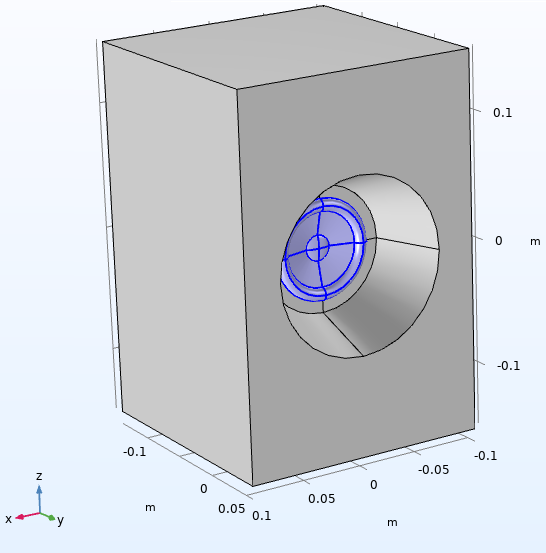


When measuring directivity, the most intuitive idea is to distribute a lot of receivers at the surface of a sphere surrounding the source. Thus, one can plot the magnitude of the pressure in a 3D balloon plot. The problem is the **spatial resolution** needed, limited by the number of points measured at the surface of the sphere. Another problem is that measuring in the **far-field** of the sound source is generally difficult (e.g. large anechoic room needed, low SNR, high positioning error at high frequencies, etc). 

One thing we can do to amend such problems is to process the measured data as an inverse problem using **Spherical Harmonics** (SH) or what we call here "**Exterior Spherical NAH**". In this case, a feaseable spatial resolution measurement in the near-field of the source render SH coefficients that can be used to reconstruct the sound field in a far-field with arbitrary resolution.

# Theory

**The following text was mostly taken from Chapter 6 of Fourier Acoustics, Earl G. Williams.**

Wave expansions in cylindrical and planar geometries consist of wavefronts which extend to infinity in at least one dimension ($\hat{z}$ or ($\hat{x}, \hat{y}, \hat{z}$), respectively). On the other hand, the spherical geometry provides a finite and compact expansion of wavefronts which allows us to gain an understanding of expanding waves. Furthermore, compact and realistic vibrators are more closely modeled with spherical wave expansions than with planar or cylindrical expansions. We present in this notebook the solution of the wave equation in spherical coordinates, and detailed discussions of the radial functions, spherical harmonics and multipole expansions, the latter being very useful for low frequency modeling of radiation from compact vibrators.

### 1.1. The Wave Equation

The coordinate system is given in the following figure and is related to rectangular coordinates through

$$
\begin{align}
x & =r \sin \theta \cos \phi \\
y & =r \sin \theta \sin \theta \label{eq1}\tag{1} \\
z & =r \cos \theta
\end{align}
$$

so that $r=\sqrt{x^{2}+y^{2}+z^{2}}, \theta=\tan ^{-1}\left[\sqrt{x^{2}+y^{2}} / z\right]$. and $\phi=\tan ^{-1}[y / x]$.


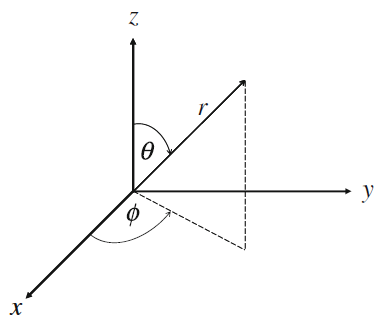


The time dependent wave equation given in spherical coordinates is

$$
\begin{align}
\frac{1}{r^{2}} \frac{\partial}{\partial r}\left(r^{2} \frac{\partial p}{\partial r}\right)+\frac{1}{r^{2} \sin \theta} \frac{\partial}{\partial \theta}\left(\sin \theta \frac{\partial p}{\partial \theta}\right)+\frac{1}{r^{2} \sin ^{2} \theta} \frac{\partial^{2} p}{\partial \phi^{2}}-\frac{1}{c^{2}} \frac{\partial^{2} p}{\partial t^{2}}=0 \label{eq2}\tag{2} 
\end{align}
$$

The solution of the wave equations is given by separation of variables:
$$
\begin{align}
p(r, \theta, \phi, t)=R(r) \Theta(\theta) \Phi(\phi) T(t) \label{eq3}\tag{3}
\end{align}
$$
in which we note that there are functions on time, $T(t)$, the radius, $R(r)$, elevation angle, $\Theta(\theta)$, and azimuth angle $\Phi(\phi)$. This leads to four ordinary differential equations: 

$$
\begin{align}
\frac{\text{d}^{2} \Phi}{\text{d} \phi^{2}}+m^{2} \Phi & =0 \label{eq4a}\tag{4-a}\\
\frac{1}{\sin \theta} \frac{\text{d}}{\text{d} \theta}\left(\sin \theta \frac{\text{d} \Theta}{\text{d} \theta}\right)+\left[n(n+1)-\frac{m^{2}}{\sin ^{2} \theta}\right] \Theta & =0, \label{eq4b}\tag{4-b} \\
\frac{1}{r^{2}} \frac{\text{d}}{\text{d} r}\left(r^{2} \frac{\text{d} R}{d \text{d}}\right)+k^{2} R-\frac{n(n+1)}{r^{2}} R & =0, \label{eq4c}\tag{4-c} \\
\frac{1}{c^{2}} \frac{\text{d}^{2} T}{\text{d} t^{2}}+k^{2} T & =0 \label{eq4d}\tag{4-d}.
\end{align}
$$

For $k=\omega / c$, the solution to Eq. \eqref{eq4d} is

$$
\begin{align}
T(\omega)=T_{1} \text{e}^{\text{j}\omega t} \label{eq5}\tag{5}
\end{align}
$$


The solution to Eq. \eqref{eq4a} is

$$
\begin{align}
\Phi(\phi)=\Phi_{1} \text{e}^{\text{j} m \phi}+\Phi_{2} \text{e}^{-\text{j} m \phi} \label{eq6}\tag{6}.
\end{align}
$$

Note that $m$ **must be an integer** ($m \in \mathbb{Z}$) so that there is continuity and periodicity of the function $\Phi(\phi)$.

The solution to Eq. \eqref{eq4b} is found using a transformation of variables. Let $\eta=\cos(\theta)$ $(-1 \leq \eta \leq 1)$, so that the differential equation for $\Theta$ becomes

$$
\frac{\text{d}}{\text{d} \eta}\left[\left(1-\eta^{2}\right) \frac{\text{d} \Theta}{\text{d} \eta}\right]+\left[n(n+1)-\frac{m^{2}}{1-\eta^{2}}\right] \Theta=0
$$

The solutions are given by Legendre functions of the first and second kinds,

$$
\begin{align}
\Theta(\theta)=\Theta_{1} P_{n}^{m}(\cos \theta)+\Theta_{2} Q_{n}^{m}(\cos \theta)\label{eq7}\tag{7}
\end{align}
$$

The functions of the second kind, $Q_{n}^{m}$, are not finite at the poles where $\eta= \pm 1$ so this solution is discarded $\left(\Theta_{2}=0\right)$. The functions of the first kind diverge at $\cos(\theta) = 1$ $(\theta=0)$ unless we restrict $n$ to be an **integer** ($n \in \mathbb{Z}$). Furthermore, when $n \in \mathbb{Z}$, then $P_{n}^{m}(\eta)=0$ when $m>n$. 
So, in short:

- $n$ and $m$ must be integers, $\in \mathbb{Z}$
- $n = 0, 1, 2, 3, \cdots, \infty$
- $-n \leq m \leq +n$

Finally for the radial differential equation, Eq. \eqref{eq4c}. the solutions are

$$
\begin{align}
R(r)=R_{3} h_{n}^{(1)}(k r)+R_{4} h_{n}^{(2)}(k r)\label{eq8}\tag{8}
\end{align}
$$

where $h_{n}^{(1)}$ and $h_{n}^{(2)}$ are spherical Hankel functions of first and second kinds, respectivelly. Depending on the problem we may keep both terms (radiation and reflection) or just one (radiation). Just as with the cylindrical Bessel functions it is true that

$$
h_{n}^{(1)}(k r) \propto \text{e}^{\text{j} k r},
$$

representing an incoming wave and

$$
h_{n}^{(2)}(k r) \propto \text{e}^{-\text{j} k r},
$$

representing an outgoing wave. We may keep one or both of these solutions depending upon the locations of the sources in the problem.

## Summing up

We can write any solution to Eq. \eqref{eq2}. with $\text{e}^{\text{j} \omega t}$ implicit, as

$$
\begin{align}
p(r, \theta, \phi, \omega)=\sum_{n=0}^{\infty} \sum_{m=-n}^{n}\left(c_{n m} h_{n}^{(2)}(k r)+d_{n m} h_{n}^{(1)}(k r)\right) Y_{n}^{m}(\theta, \phi) \label{eq9}\tag{9}
\end{align}
$$
for traveling wave solutions. Note that we separated the terms along the elevation and azimuth angles in a function $Y_{n}^{m}(\theta, \phi)$ (called the **spherical harmonics** functions) and in functions of the radius $r$ (called the **spherical hankel functions** of first, $h_{n}^{(1)}(k r)$,and second kinds, $h_{n}^{(2)}(k r)$). 

The terms $c_{n m}$ and $d_{n m}$ are **coefficients to be determined in an inverse problem** (more about that later). 


We now study the properties of the terms in Eq. \eqref{eq9} in more detail. 

### 1.2. Spherical hankel functions

First, there is something I did not mentioned earlier. The spherical hankel functions in Eq. ([9](#mjx-eqn-eq9)) are used in **exterior** spherical holography (when all the relevant sound sources are inside the measurement sphere). There are cases in which the a spherical array is used to infer properties of a sound field, for which, the sources are outside of the measurement sphere. In those cases the solution of   Eq. ([9](#mjx-eqn-eq9)) is re-written using spherical bessel functions (**interior** spherical holography).

Solutions to the wave equation in spherical coordinates include spherical Bessel and Hankel functions. These functions are presented in this section. The spherical Bessel function of the first kind, $j_{n}(x)$, and of the second kind, $y_{n}(x)$, can be written using Rayleigh formulas as [4]

$$
\begin{align}
j_{n}(x)=(-1)^{n} x^{n}\left(\frac{1}{x} \frac{d}{d x}\right)^{n} \frac{\sin (x)}{x} \label{eq10}\tag{10}
\end{align}
$$

and

$$
\begin{align}
y_{n}(x)=-(-1)^{n} x^{n}\left(\frac{1}{x} \frac{d}{d x}\right)^{n} \frac{\cos (x)}{x} \label{eq11}\tag{11}
\end{align}
$$

with the spherical Hankel functions of the first kind, $h_{n}(x)$, and the second kind, $h_{n}^{(2)}(x)$, written as

$$
\begin{align}
h_{n}^{(1)}(x)=j_{n}(x)+\text{j} y_{n}(x) \label{eq12a}\tag{12a} \\
h_{n}^{(2)}(x)=j_{n}(x)-\text{j} y_{n}(x) \label{eq12b}\tag{12b}
\end{align}
$$



Because the spherical Bessel functions are real, $j_{n}(x)$ and $y_{n}(x)$ compose the real and imaginary part of $h_{n}(x)$, i.e.

The spherical Bessel and Hankel functions are also related to the Bessel function, $J_{\alpha}(x)$, and the Hankel function, $H_{\alpha}(x)$, through

$$
j_{n}(x)=\sqrt{\frac{\pi}{2 x}} J_{n+\frac{1}{2}}(x)
$$

and

$$
h_{n}(x)=\sqrt{\frac{\pi}{2 x}} H_{n+\frac{1}{2}}(x)
$$

The Spherical Hankel functions of the first kind for the first few orders are

$$
\begin{align}
h_{0}(x)=\frac{\text{e}^{\text{j} x}}{\text{j} x}\\
h_{1}(x)=-\frac{\text{e}^{\text{j} x}(\text{j}+x)}{x^{2}}\\
h_{2}(x)=\frac{\text{j} \text{e}^{\text{j} x}\left(-3+3 \text{j} x+x^{2}\right)}{x^{3}}\\
h_{3}(x)=\frac{\text{e}^{\text{j} x}\left(-15 \text{j}-15 x+6 \text{j} x^{2}+x^{3}\right)}{x^{4}}
\end{align}
$$



Let us investigate the behaviour of $h_{n}^{(2)}(kr)$ as the order $n$ increases. The important points are:

- The real and imaginary parts decreases for larger values of $kr$
- The imaginary part increases towards $\infty$ as $kr \rightarrow 0$
- Thus, the magnitude  increases towards $\infty$ as $kr \rightarrow 0$ (singularity of monopole) and decreases for larger values of $kr$. Note also de $6$ [dB] decay with doubling distance in the far-field.

<IPython.core.display.Javascript object>


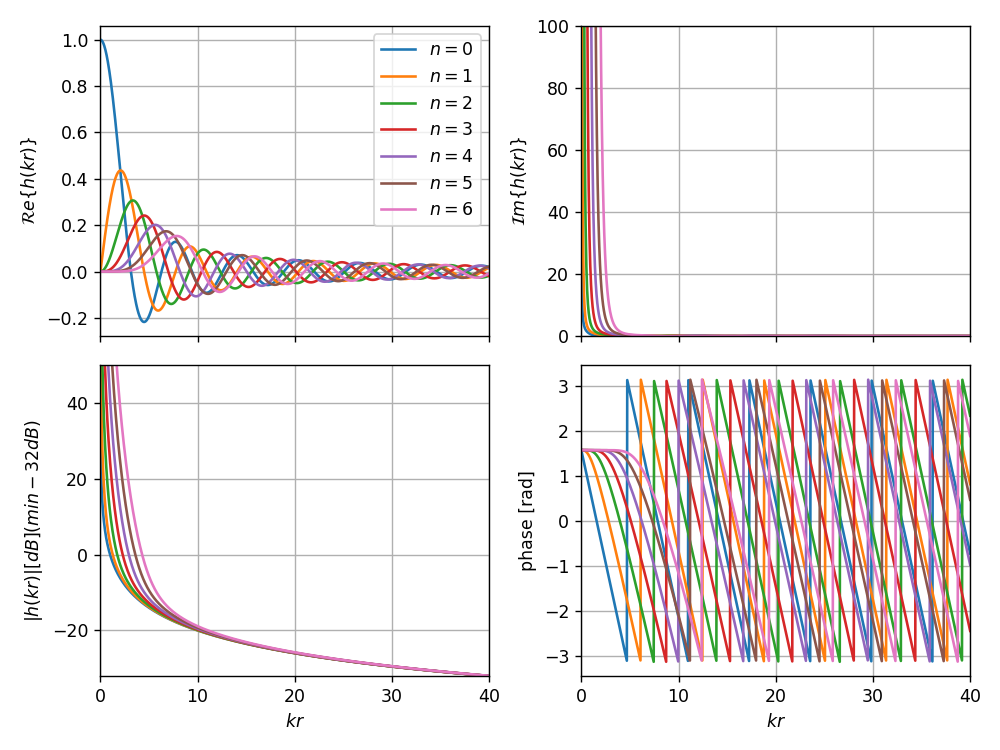

In [2]:
kr = np.linspace(0.0001, 40, 1000)

n_s = np.arange(0, 7, 1)

f, ax = plt.subplots(2, 2, figsize = (8,6), sharex = True)

for i, n in enumerate(n_s):
    hn2 = spa.sph.spherical_hn2(n, kr)
    ax[0,0].plot(kr, np.real(hn2), label = r'$n = {}$'.format(n))
    ax[0,0].set_xlim((0, np.amax(kr)))
    ax[0,0].set_ylabel(r'$\mathcal{R}e\left\{h(kr) \right\}$')
    ax[0,0].grid()
    
    ax[0,1].plot(kr, np.imag(hn2), label = r'$n = {}$'.format(n))
    ax[0,1].set_xlim((0, np.amax(kr)))
    
    ax[0,1].set_ylabel(r'$\mathcal{I}m\left\{h(kr) \right\}$')
    ax[0,1].set_ylim((0, 100))
    ax[0,1].grid()
    
    ax[1,0].plot(kr, 20*np.log10(np.abs(hn2)), label = r'$n = {}$'.format(n))
    ax[1,0].set_xlim((0, np.amax(kr)))
    ax[1,0].set_ylabel(r'$|h(kr)| [dB] (min -32 dB)$')
    ax[1,0].set_ylim((-32, 50))
    ax[1,0].grid()
    
    ax[1,1].plot(kr, np.angle(hn2), label = r'$n = {}$'.format(n))
    ax[1,1].set_xlim((0, np.amax(kr)))
    ax[1,1].set_ylabel('phase [rad]')
    ax[1,1].grid()

ax[0,0].legend()
ax[1,0].set_xlabel(r'$kr$')
ax[1,1].set_xlabel(r'$kr$')
plt.tight_layout()

### 1.2. Angular functions (spherical harmonics)

The angular functions over $\theta$ and $\phi$ are conveniently combined into a single function called the **spherical harmonic** $Y_{n}^{m}$ defined by

$$
\begin{align}
Y_{n}^{m}(\theta, \phi) = \sqrt{\frac{(2 n+1)}{4 \pi} \frac{(n-m) !}{(n+m) !}} P_{n}^{m}(\cos \theta) \text{e}^{\text{j} m \phi}
\end{align} \label{eq13}\tag{13}
$$

Note that they are valid for:

- $n = 0, 1, 2, \cdots, \infty$
- and for each $n$, $m = -n, \cdots, -1, 0, 1, \cdots, +n$. 

This renders the following functions in space:

$$
\begin{align}
Y_{0}^{0}(\theta, \phi)=\frac{1}{4 \pi} \label{eq14a}\tag{14a}
\end{align}
$$

</br>

$$
\begin{align}
Y_{1}^{-1}(\theta, \phi)=\sqrt{\frac{3}{8 \pi}}\text{sin}(\theta)\text{e}^{-\text{j} \phi}, \\ 
Y_{1}^{0}(\theta, \phi)=\sqrt{\frac{3}{3 \pi}}\text{cos}(\theta), \label{eq14b}\tag{14b} \\
Y_{1}^{+1}(\theta, \phi)=-\sqrt{\frac{3}{8 \pi}}\text{sin}(\theta)\text{e}^{\text{j} \phi} 
\end{align}
$$

</br>

$$
\begin{align}
Y_{2}^{-2}(\theta, \phi)=\sqrt{\frac{15}{32 \pi}}\text{sin}^{2}(\theta)\text{e}^{-2\text{j} \phi}, \\
Y_{2}^{-1}(\theta, \phi)=\sqrt{\frac{15}{8 \pi}}\text{sin}(\theta)\text{cos}(\theta)\text{e}^{-\text{j} \phi}, \\
Y_{2}^{0}(\theta, \phi)=\sqrt{\frac{5}{16 \pi}}(3\text{cos}^{2}(\theta) -1), \label{eq14c}\tag{14c} \\
Y_{2}^{+1}(\theta, \phi)=-\sqrt{\frac{15}{8 \pi}}\text{sin}(\theta)\text{cos}(\theta)\text{e}^{+\text{j} \phi}, \\
Y_{2}^{+2}(\theta, \phi)=\sqrt{\frac{15}{32 \pi}}\text{sin}^{2}(\theta)\text{e}^{+2\text{j} \phi}
\end{align}
$$

</br>

which leads to the following plots in space

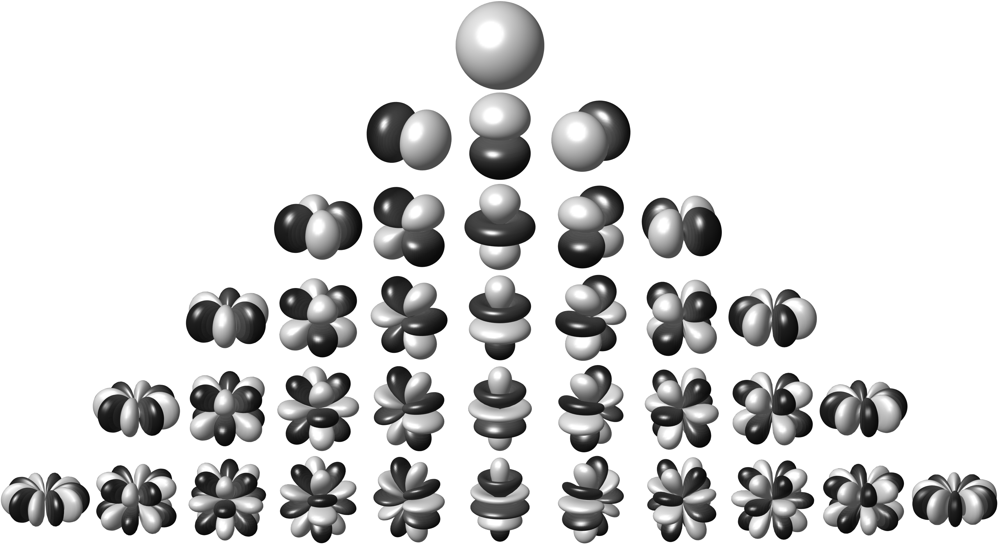

The functions are represented as directivity patterns with the distance from origin given by the magnitude and the color given by the sign of the real part of $Y(\theta, \phi)$.

#### Note that 

- $Y_{0}^{0}(\theta, \phi)$ represents a **monopole** function (constant in space)
- $Y_{1}^{-1}(\theta, \phi)$, $Y_{1}^{0}(\theta, \phi)$, and $Y_{1}^{+1}(\theta, \phi)$ represent **dipole** functions in different orientations
- $Y_{2}^{-2}(\theta, \phi)$ to $Y_{2}^{+2}(\theta, \phi)$ represent quadrupole functions in different orientations
- so on, and so fourth.
- Thus as order $n$ increases there are more and more sub-orders $m$, and the spatial frequency of the functions are increasing
- Therefore, we expect that the SVD should have higher singular values, \sigma, related to higher order spherical harmonics

Let us make some plots of spherical harmonics functions, so you can play around with it. (not as pretty as the plot above given to me so kindly by Franz Zotter - thank you, mate!)

<IPython.core.display.Javascript object>


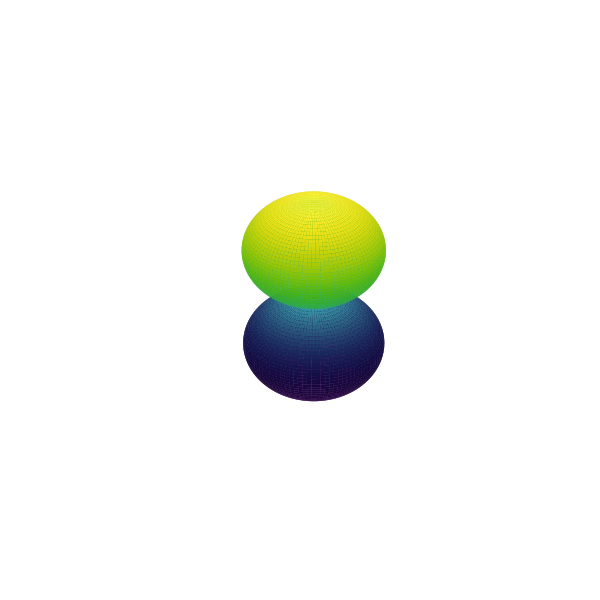

In [31]:
fig = plt.figure(figsize=plt.figaspect(1.))
ax = fig.add_subplot(111, projection='3d')
utp._plot_sh(ax, ut._Yscipy, n=1, m=0, npts = 100, azdeg = 315, eldeg = 45, 
             theta_lim = np.pi)

# Exterior spherical NAH

The exterior domain is defined as shown in the Figure below. The sphere of radius $a$ is the smallest sphere tangent to the outermost extremity of the source and does not cut through the source at any point. 

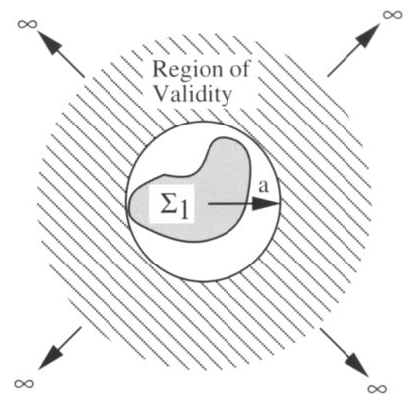


It is assumed that the source radiates to free-field. Thus, Eq. ([9](#mjx-eqn-eq9)) can be re-writen with $d_{n m} = 0$ (no incoming waves). The radiated pressure field is given by

$$
\begin{align}
p(r, \theta, \phi, \omega)\approx\sum_{n=0}^{N} \sum_{m=-n}^{n} c_{n m}(\omega) h_{n}^{(2)}(k r) Y_{n}^{m}(\theta, \phi) \label{eq15}\tag{15} 
\end{align}
$$

The radiated pressure field is completely defined when the coefficients $c_{n m}$ are determined. Of course we truncated the sum in $n$ at a maximum order $N$. 

Usually, to avoid spatial aliasing the number of receivers, $M$, is such that $(N+1)^2 \leq M$. We can write the double sum above for $M$ receivers distributed in a sphere of radius $r_h$ as

$$
\begin{align}
p(\textbf{r}_1) = c_{00} Y_{0}^{0}(\Omega_1) h_{0}^{(2)}(k r_h) + c_{1-1} Y_{1}^{-1}(\Omega_1) h_{1}^{(2)}(k r_h) + c_{10} Y_{1}^{0}(\Omega_1) h_{1}^{(2)}(k r_h) + c_{1+1} Y_{0}^{+1}(\Omega_1) h_{1}^{(2)}(k r_h) + \cdots \\
p(\textbf{r}_2) = c_{00} Y_{0}^{0}(\Omega_2) h_{0}^{(2)}(k r_h) + c_{1-1} Y_{1}^{-1}(\Omega_2) h_{1}^{(2)}(k r_h) + c_{10} Y_{1}^{0}(\Omega_1) h_{1}^{(2)}(k r_h) + c_{1+1} Y_{0}^{+1}(\Omega_2) h_{1}^{(2)}(k r_h) + \cdots \\
\vdots \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \ \  \ \ \ \ \ \ \ \ \ \ \  \ \ \ \ \ \ \ \ \ \ \ \  \\
p(\textbf{r}_M) = c_{00} Y_{0}^{0}(\Omega_M) h_{0}^{(2)}(k r_h) + c_{1-1} Y_{1}^{-1}(\Omega_M) h_{1}^{(2)}(k r_h) + c_{10} Y_{1}^{0}(\Omega_M) h_{1}^{(2)}(k r_h) + c_{1+1} Y_{0}^{+1}(\Omega_M) h_{1}^{(2)}(k r_h) + \cdots
\end{align}
$$
with $\Omega_i = (\theta_i, \phi_i)$. Then, we can assemble the following system of equations in matrix form

</br>
$$
\begin{align}
\textbf{p} = \textbf{Y} \ \textbf{h} \ \textbf{c} \label{eq16}\tag{16} 
\end{align}
$$
</br>
where $\textbf{c} = [c_{00}, \ c_{1-1}, \ c_{10}, \ c_{11}, \ \cdots]^{T} \in \mathbb{C}^{(N+1)^2 \times 1}$ is the coefficient vector to be determined. 

</br>

Matrix $\textbf{h} \in \mathbb{C}^{(N+1)^2 \times (N+1)^2}$ is a diagonal matrix containing the hankel functions

$$
\begin{align}
\textbf{h} = \text{diag}([h_{0}^{(2)}(k r_h), h_{1}^{(2)}(k r_h), h_{1}^{(2)}(k r_h), h_{1}^{(2)}(k r_h), \cdots])
\end{align}
$$

</br>
and the spherical harmonics matrix $\textbf{Y} \in \mathbb{C}^{M \times (N+1)^2}$ is

$$
\begin{align}
\textbf{Y} = \begin{bmatrix} Y_{0}^{0}(\Omega_1) & Y_{1}^{-1}(\Omega_1) & Y_{1}^{0}(\Omega_1) & Y_{1}^{1}(\Omega_1) & \cdots\\
Y_{0}^{0}(\Omega_2) & Y_{1}^{-1}(\Omega_2) & Y_{1}^{0}(\Omega_2) & Y_{1}^{1}(\Omega_2) & \cdots\\
\vdots & \vdots & \vdots & \vdots & \vdots \\
Y_{0}^{0}(\Omega_M) & Y_{1}^{-1}(\Omega_M) & Y_{1}^{0}(\Omega_M) & Y_{1}^{1}(\Omega_M) & \cdots
\end{bmatrix}
\end{align}
$$

</br>

Then, the reconstruction problem is
$$
\begin{align}
\textbf{p}_{\text{rec}} = \textbf{Y}_{\text{rec}} \ \textbf{h}_{\text{rec}} \ \textbf{c}  \label{eq17}\tag{17} 
\end{align}
$$


We note that the sensing matrix of the problem is $\textbf{A} = \textbf{Y}\textbf{h}$ (Eq. \eqref{eq16}). Since $\textbf{h}$ varies with frequency, the sensing matrix also vary with frequency. Another way to pose the inverse problem is to re-write Eq. \eqref{eq16}, hiding the distance factor in the sensing matrix. Thus, for a single receiver, we have

$$
\begin{align}
p(r_h, \theta, \phi, \omega)=\sum_{n=0}^{N} \sum_{m=-n}^{n} c_{n m}(\omega) Y_{n}^{m}(\theta, \phi)  \label{eq18}\tag{18} 
\end{align}
$$
but now the coefficients $c_{n m}$ encondes the measured distance, $r_h$. The system of equations is

</br>
$$
\begin{align}
\textbf{p} = \textbf{Y} \ \textbf{c} \label{eq19}\tag{19} 
\end{align}
$$

The advantage here is that the sensing matrix is $\textbf{A} = \textbf{Y}$, **independent of frequency**, allowing for a single SVD to be computed in a frequency loop (huge advantage). The reconstruction at a single point is achieved by

$$
\begin{align}
p(r_{\text{rec}}, \theta, \phi, \omega)=\sum_{n=0}^{N} \sum_{m=-n}^{n} c_{n m}(\omega) \frac{h_{n}^{(2)}(k r_{\text{rec}})}{h_{n}^{(2)}(k r_h)} Y_{n}^{m}(\theta, \phi) \label{eq20}\tag{20}
\end{align}
$$

In matrix form it is the same as in Eq. \eqref{eq17}, but with $\textbf{h}_{\text{rec}} = \text{diag}([\frac{h_{0}^{(2)}(k r_{\text{rec}})}{h_{0}^{(2)}(k r_h)}, \frac{h_{1}^{(2)}(k r_{\text{rec}})}{h_{1}^{(2)}(k r_h)}, \frac{h_{1}^{(2)}(k r_{\text{rec}})}{h_{1}^{(2)}(k r_h)}, \frac{h_{1}^{(2)}(k r_{\text{rec}})}{h_{1}^{(2)}(k r_h)}, \cdots])$. 

Thefore, the distance factor is encoded in the reconstuction process. Usually, this is straighforward if $r_{\text{rec}} > r_h$ (**outside measurement sphere**), since the sound field decays. When we try to reconstruc the sound field for $r_{\text{rec}} < r_h$ (**inside measurement sphere**) the sound field should amplify, which is similar to evanescent waves in the plane wave expansion - noise and measurement errors will make the ill-posedness of this problem.

The formulation of the interior problem (and the consequences) are slightly different. We will not deal with them in this notebook.

# Load the dataset

We simulated the sound field of that interesting loudspeaker using comsol multiphysics 6.1, and measured the total pressure at discrete points on spherical surfaces of varius radii. The data was exported from Comsol in ".txt" file and processed as a .mat file containing the coordinates of measured points, sound pressure and triangulation (for mesh plotting). Matlab was used here due to previouly built tools for reading and processing meshes.

We also add noise to the array data (before decomposition).

In [7]:
freq = [250, 500, 1000, 2000, 3000, 4000] #[1000, 2000, 3000]

### Array for decomposition

The arrays that you can use here have $M=162$ microphones:

- 10 elevation angles from $-90^{\circ} \leq \theta \leq 90^{\circ}$
- 20 elevation angles from $-180^{\circ} \leq \phi \leq 180^{\circ}$

Two raddi are available

- $r_h = 25$ cm
- $r_h = 100$ cm

In [8]:
folder = 'comsol_data/'
mat_contents_dec_array = sio.loadmat(folder + 'sph_array_10x20_25cm.mat')
print("Shape of nodes: {}".format(mat_contents_dec_array['nodes'].shape))
print("Shape of triangles: {}".format(mat_contents_dec_array['triangles'].shape))
print("Shape of pressure: {}".format(mat_contents_dec_array['pres'].shape))

# Add noise
pres2decomp_noisefree =  mat_contents_dec_array['pres']
pres2decomp = gfun.add_noise2(pres2decomp_noisefree, snr = 30)

dec_array = Receiver()
dec_array.coord = mat_contents_dec_array['nodes']

Shape of nodes: (162, 3)
Shape of triangles: (320, 3)
Shape of pressure: (162, 6)
mean snr 32.68397336739173


### Arrays for reconstruction

The arrays that you can use for reconstruction have $M=1682$ microphones (a near 10 fold increase in resolution) and are:

- 30 elevation angles from $-90^{\circ} \leq \theta \leq 90^{\circ}$
- 60 elevation angles from $-180^{\circ} \leq \phi \leq 180^{\circ}$

Three raddi are available

- $r = 25$ cm
- $r = 100$ cm
- $r = 200$ cm

This means that you can decompose at $r_h = 25$ cm (with **low resolution**) and reconstruct with **high resolution** at the same or larger $r$, or you can decompose at $r_h = 100$  cm and reconstruct at $r = 25$ cm or $r = 200$ cm.

In [9]:
# Array 1
mat_contents_rec_array_1m = sio.loadmat(folder + 'sph_array_30x60_100cm.mat')
print("Array @1m - Shape of nodes: {}".format(mat_contents_rec_array_1m['nodes'].shape))
print("Array @1m - Shape of triangles: {}".format(mat_contents_rec_array_1m['triangles'].shape))
print("Array @1m - Shape of pressure: {}".format(mat_contents_rec_array_1m['pres'].shape))
rec_array_1m = Receiver()
rec_array_1m.coord = mat_contents_rec_array_1m['nodes']

# Array 2
mat_contents_rec_array_2m = sio.loadmat(folder + 'sph_array_30x60_200cm.mat')
print("Array @2m - Shape of nodes: {}".format(mat_contents_rec_array_2m['nodes'].shape))
print("Array @2m - Shape of triangles: {}".format(mat_contents_rec_array_2m['triangles'].shape))
print("Array @2m - Shape of pressure: {}".format(mat_contents_rec_array_2m['pres'].shape))
rec_array_2m = Receiver()
rec_array_2m.coord = mat_contents_rec_array_2m['nodes']

# Array 3
mat_contents_rec_array_25cm = sio.loadmat(folder + 'sph_array_30x60_25cm.mat')
print("Array @25cm - Shape of nodes: {}".format(mat_contents_rec_array_25cm['nodes'].shape))
print("Array @25cm - Shape of triangles: {}".format(mat_contents_rec_array_25cm['triangles'].shape))
print("Array @25cm - Shape of pressure: {}".format(mat_contents_rec_array_25cm['pres'].shape))
rec_array_25cm = Receiver()
rec_array_25cm.coord = mat_contents_rec_array_25cm['nodes']

Array @1m - Shape of nodes: (1682, 3)
Array @1m - Shape of triangles: (3360, 3)
Array @1m - Shape of pressure: (1682, 6)
Array @2m - Shape of nodes: (1682, 3)
Array @2m - Shape of triangles: (3360, 3)
Array @2m - Shape of pressure: (1682, 6)
Array @25cm - Shape of nodes: (1682, 3)
Array @25cm - Shape of triangles: (3360, 3)
Array @25cm - Shape of pressure: (1682, 6)


### Plot the sound scene

Note that the data the we measured come in a coarse discretization. What we want to do is to decompose the measured dataset (coarse) to the spherical harmonics domain (compute the $c_{n m}$ coefficients) and reconstruct the sound pressure in a finer array at different distances. Let's look at measured and reconstruction arrays.

<IPython.core.display.Javascript object>


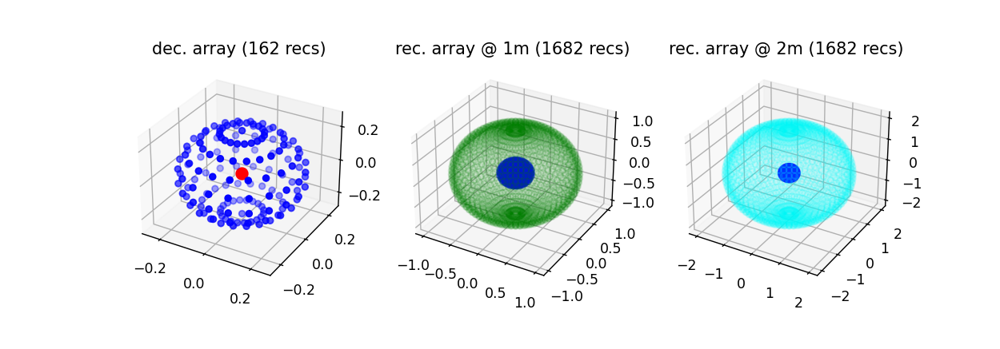

In [10]:
fig, ax = plt.subplots(1, 3, figsize = (10,3.5), subplot_kw=dict(projection='3d'))
ax[0].scatter3D(dec_array.coord[:,0], dec_array.coord[:,1], dec_array.coord[:,2], 
             color = "blue", label = 'dec_array')
ax[0].scatter3D(0, 0, 0,  color = "red", s=70)
ax[0].set_title("dec. array (162 recs)")

ax[1].scatter3D(dec_array.coord[:,0], dec_array.coord[:,1], dec_array.coord[:,2], 
             color = "blue", alpha = 0.5, label = 'dec_array')
ax[1].scatter3D(rec_array_1m.coord[:,0], rec_array_1m.coord[:,1], rec_array_1m.coord[:,2], 
             color = "green", alpha = 0.1, label = 'rec_array_1m')
ax[1].scatter3D(0, 0, 0,  color = "red", s=70)
ax[1].set_title("rec. array @ 1m (1682 recs)")

ax[2].scatter3D(dec_array.coord[:,0], dec_array.coord[:,1], dec_array.coord[:,2], 
             color = "blue", alpha = 0.5, label = 'dec_array')
ax[2].scatter3D(rec_array_2m.coord[:,0], rec_array_2m.coord[:,1], rec_array_2m.coord[:,2], 
             color = "cyan", alpha = 0.1, label = 'rec_array_2m')
ax[2].scatter3D(0, 0, 0,  color = "red", s=70)
ax[2].set_title("rec. array @ 2m (1682 recs)");

## Plot of coarse and fine directivities 

Note that the coarse grid has about 160 receivers, while the fine grid has about 1700 receivers. We would not measure the second one.

In [11]:
idf = 3
dinrange = 20

# specify 3D plot
n_cols = 2
n_rows = 1
spec_dict = [[{'type': 'surface'}]*n_cols]*n_rows
# set the figure with subplots
figs = make_subplots(rows = n_rows, cols = n_cols, specs = spec_dict, 
                     horizontal_spacing = 0.02, vertical_spacing = 0.02, 
                     subplot_titles = ('Coarse grid @ {} Hz'.format(freq[idf]), 'Fine grid'))

# coarse grid
_, trace = ut_is.plot_3d_polar(dec_array.coord, mat_contents_dec_array['triangles'], 
    mat_contents_dec_array['pres'][:,idf], dinrange = dinrange, color_method = 'dB', radius_method = 'dB', 
    color_code = 'jet', view = 'iso_z', eye = None, renderer = 'notebook', remove_axis = False)
figs.add_trace(trace, row = 1, col = 1)

# fine grid
_, trace = ut_is.plot_3d_polar(rec_array_1m.coord, mat_contents_rec_array_1m['triangles'], 
    mat_contents_rec_array_1m['pres'][:,idf], dinrange = dinrange, color_method = 'dB', radius_method = 'dB', 
    color_code = 'jet', view = 'iso_z', eye = None, renderer = 'notebook', remove_axis = False)
figs.add_trace(trace, row = 1, col = 2)

figs.show()

# Setting up the inverse problem from scratch

- Let's play with the truncation order.


1. You have $M$ measurements at coordinates $\textbf{r}_1, \cdots, \textbf{r}_M$, with $r_{i} = (r_h, \theta_i, \phi_i)$;

2. Thus, you have the problem matrix:

$$
\begin{align}
\textbf{Y} = \begin{bmatrix} Y_{0}^{0}(\Omega_1) & Y_{1}^{-1}(\Omega_1) & Y_{1}^{0}(\Omega_1) & Y_{1}^{1}(\Omega_1) & \cdots\\
Y_{0}^{0}(\Omega_2) & Y_{1}^{-1}(\Omega_2) & Y_{1}^{0}(\Omega_2) & Y_{1}^{1}(\Omega_2) & \cdots\\
\vdots & \vdots & \vdots & \vdots & \vdots \\
Y_{0}^{0}(\Omega_M) & Y_{1}^{-1}(\Omega_M) & Y_{1}^{0}(\Omega_M) & Y_{1}^{1}(\Omega_M) & \cdots
\end{bmatrix}
\end{align}
$$

Generally you'd have an over-determined system of equations. You can:

4. Compute the SVD da matriz $\textbf{Y} = \textbf{U}\Sigma\textbf{V}^T$
5. Use the SVD and the vector of measured pressure, $\textbf{p}$, to compute the regularization parameter, $\lambda$.
6. Compute the regularized solution

\begin{equation}
\hat{\textbf{x}}_{\lambda} = \sum\limits_{i=1}^{L}\varphi_{i}^{[\lambda]}\frac{\textbf{u}_{i}^{T}\textbf{b}}{\sigma_i} \textbf{v}_{i}
\end{equation}

or you can

6. compute the least-squares solution (very common)

7. Reconstruction and analysis

In [20]:
n_max_order =11
sh_type = 'complex'
air = AirProperties(c0 = 343, rho0 = 1.21)
controls = AlgControls(c0 = air.c0, freq_vec = freq)

In [24]:
index = 4
freqd = controls.freq[index]
print(r'freq = {0:.2f} Hz'.format(freqd))
# Receptores
r_vecs = dec_array.coord
print('shape da matriz de receptores: {}'.format(r_vecs.shape))
# Get the theta and phi angles
phi, theta, rh = spa.utils.cart2sph(r_vecs[:,0], r_vecs[:,1], r_vecs[:,2], steady_colat=False)
print(r'r_h =  {:.2f} m'.format(rh[0]))

pres = pres2decomp[:,index]
# Dados medidos (com algum ruído)
print('shape da matriz p: {}'.format(pres.shape))

freq = 3000.00 Hz
shape da matriz de receptores: (162, 3)
r_h =  0.25 m
shape da matriz p: (162,)


In [25]:
Y = spa.sph.sh_matrix(n_max_order, phi, theta, SH_type = 'complex')
print('shape da matriz Y: {}'.format(Y.shape))

shape da matriz Y: (162, 144)


shape da matriz U: (162, 144)
shape da matriz Sigma: (144,)
shape da matriz V: (144, 144)


<IPython.core.display.Javascript object>


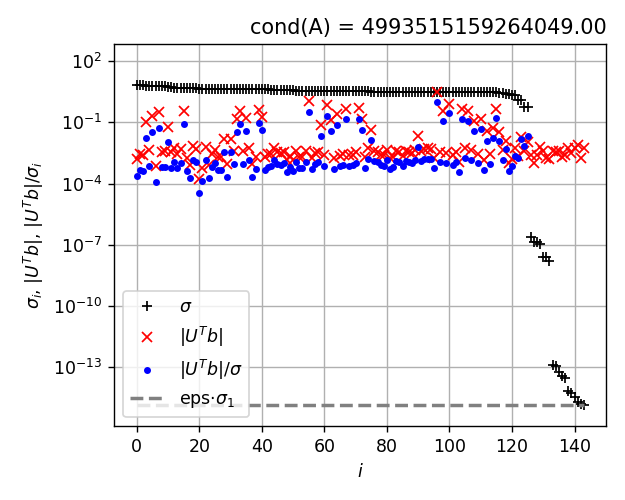

<IPython.core.display.Javascript object>


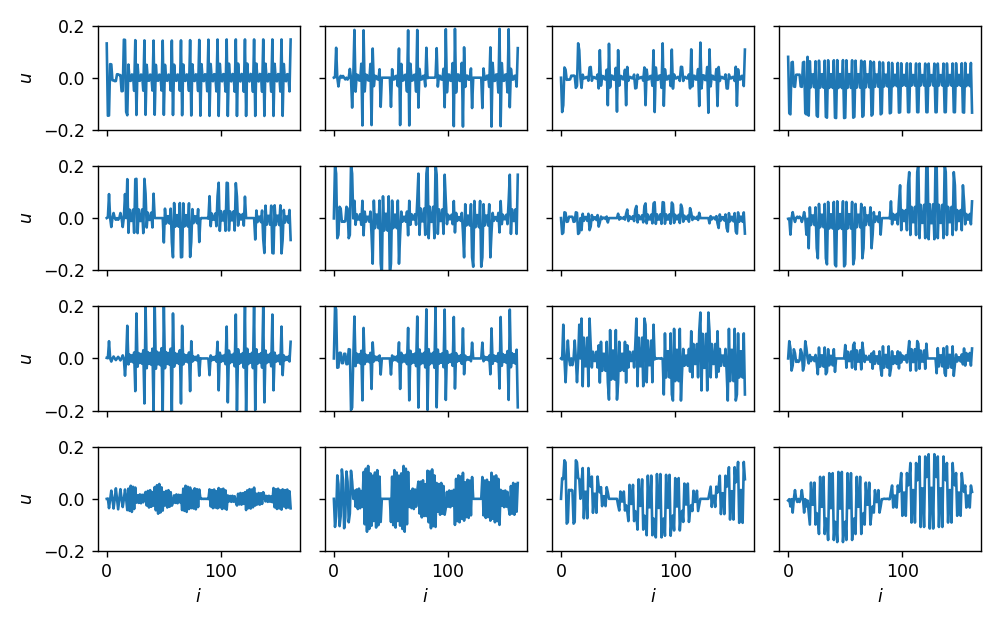

In [26]:
# SVD
[U,s,V] = lc.csvd(Y)
print('shape da matriz U: {}'.format(U.shape))
print(r'shape da matriz Sigma: {}'.format(s.shape))
print(r'shape da matriz V: {}'.format(V.shape))
# plot Picard
lc.plot_picard(U,s,pres)
# plot column vectors
lc.plot_colvecs(np.real(U))

<IPython.core.display.Javascript object>


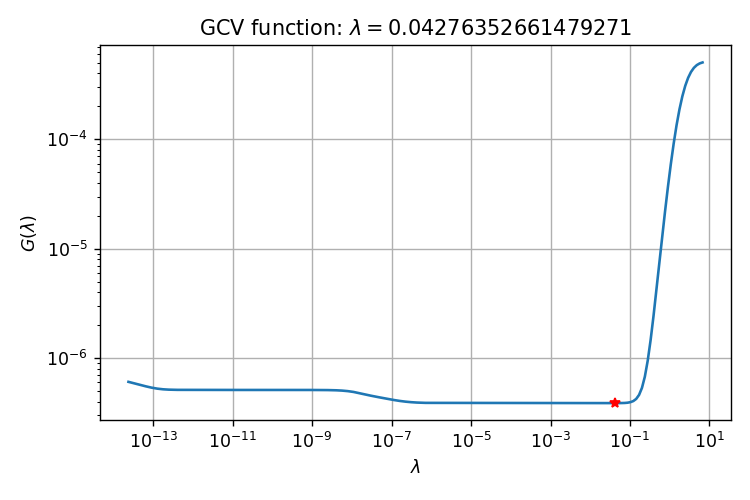

In [27]:
lam_gcv = lc.gcv_lambda(U, s, pres, print_gcvfun = True)
cnm_gcv = lc.tikhonov(U, s, V, pres, lam_gcv)

# Going pro

We can try both the regularized solution and the least-squares solution. Note that:

- The order is limited to $(N+1)^2 \leq M$ (over-determined system of equations)
- As long as the order is kept in check ($N < 8)$, the least-squares solution works well (even better than the regularized solution - this is common in such problems due to the low condition number)
- For larger orders, the regularized solution works better
- Anyway, we must avoid $(N+1)^2 > M$ because this will lead to aliasing.

In [72]:
n_max_order = 4
sh_type = 'complex'
air = AirProperties(c0 = 343, rho0 = 1.21)
controls = AlgControls(c0 = air.c0, freq_vec = freq)

In [73]:
sh_dec = SourceDirFF(pres = pres2decomp, air = air, controls = controls, 
    receivers = dec_array, bar_mode = 'terminal', n_max_order = n_max_order, sh_type = sh_type, regu_par = 'gcv')
sh_dec.compute_Y()
sh_dec.least_squares_cnm()
#sh_dec.regularized_cnm(method = 'Tikhonov', plot_l = False)
sh_dec.recon_p_freq(rec_array_1m)
sh_dec.check_decomp();

print("quality check of decomposition error: {} dB".format(sh_dec.error_db))

# NMSE
nmse = lc.nmse_freq(sh_dec.pres_recon, mat_contents_rec_array_1m['pres'])

You choose GCV to find optimal regularization parameter


Computing decomposition quality...: 100%|██████████| 6/6 [00:00<?, ?it/s]

quality check of decomposition error: [-59.84099949 -54.52470963 -44.51363075 -32.18974867 -24.67632434
 -16.52463206] dB


# Plot the decomposition

<IPython.core.display.Javascript object>


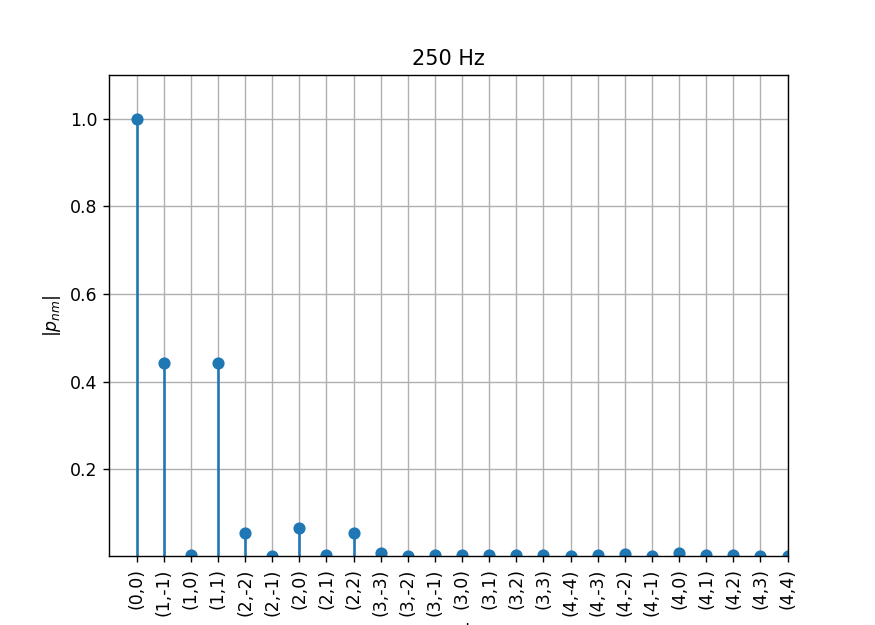

<IPython.core.display.Javascript object>


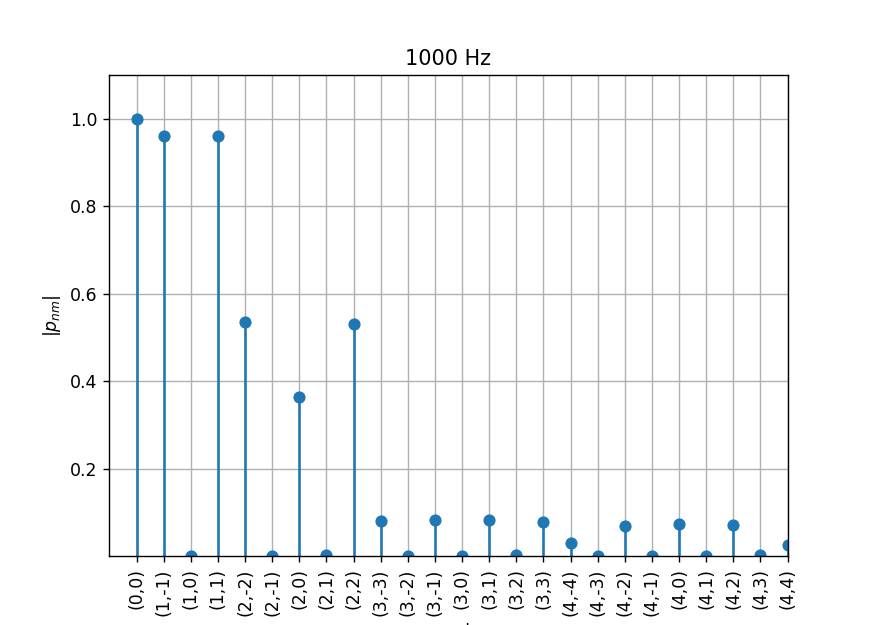

<IPython.core.display.Javascript object>


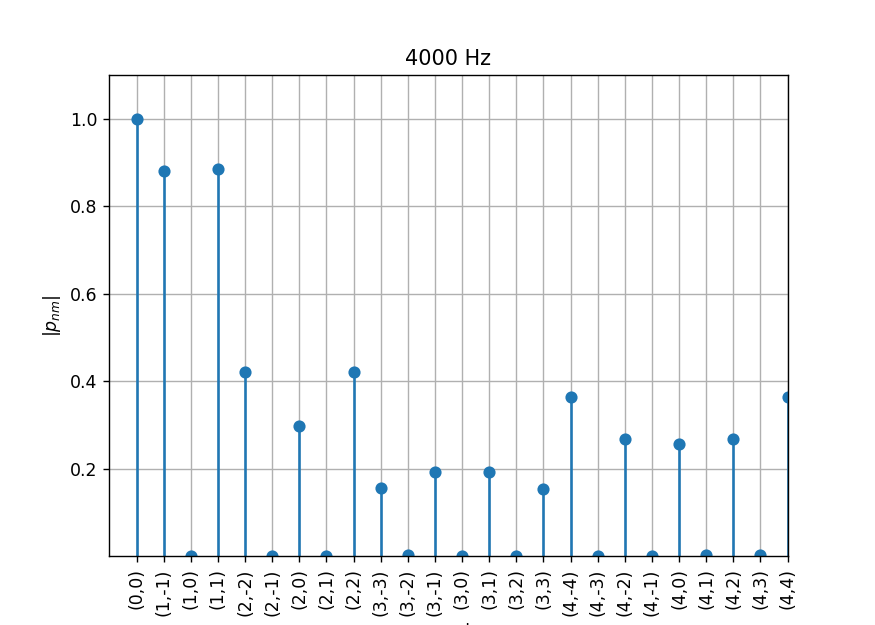

In [74]:
sh_dec.plot_sh_coeff(freq = 250, normalize = True, coef_limit = 36)
sh_dec.plot_sh_coeff(freq = 1000, normalize = True, coef_limit = 36)
sh_dec.plot_sh_coeff(freq = 4000, normalize = True, coef_limit = 36)

# Reconstruction on a finer sphere of radius 25 cm

In [75]:
sh_dec.recon_p_freq(rec_array_25cm)
# NMSE
nmse = lc.nmse_freq(sh_dec.pres_recon, mat_contents_rec_array_25cm['pres'])

Reconstruction of sound pressure: 100%|██████████| 6/6 [00:00<00:00, 6014.78it/s]


In [76]:
idf = 3
dinrange = 35

# specify 3D plot
n_cols = 2
n_rows = 1
spec_dict = [[{'type': 'surface'}]*n_cols]*n_rows
# set the figure with subplots
figs = make_subplots(rows = n_rows, cols = n_cols, specs = spec_dict, 
                     horizontal_spacing = 0.02, vertical_spacing = 0.02, 
                     subplot_titles = ('Ground truth @ {} Hz'.format(controls.freq[idf]), 
                                       'Reconstructed @ 25cm (NMSE = {:.4f})'.format(nmse[idf])))

# Ground truth
_, trace = ut_is.plot_3d_polar(rec_array_25cm.coord, mat_contents_rec_array_25cm['triangles'], 
    mat_contents_rec_array_25cm['pres'][:,idf], dinrange = dinrange, color_method = 'dB', radius_method = 'dB', 
    color_code = 'jet', view = 'iso_z', eye = None, renderer = 'notebook', remove_axis = False)
figs.add_trace(trace, row = 1, col = 1)

# Reconstructed
_, trace = ut_is.plot_3d_polar(rec_array_25cm.coord, mat_contents_rec_array_25cm['triangles'], 
    sh_dec.pres_recon[:,idf], dinrange = dinrange, color_method = 'dB', radius_method = 'dB', 
    color_code = 'jet', view = 'iso_z', eye = None, renderer = 'notebook', remove_axis = False)
figs.add_trace(trace, row = 1, col = 2)

figs.show()

# Reconstruction on a finer sphere of radius 1m

In [77]:
sh_dec.recon_p_freq(rec_array_1m)
# NMSE
nmse = lc.nmse_freq(sh_dec.pres_recon, mat_contents_rec_array_1m['pres'])

Reconstruction of sound pressure: 100%|██████████| 6/6 [00:00<00:00, 2640.42it/s]


In [78]:
idf = 5
dinrange = 35

# specify 3D plot
n_cols = 2
n_rows = 1
spec_dict = [[{'type': 'surface'}]*n_cols]*n_rows
# set the figure with subplots
figs = make_subplots(rows = n_rows, cols = n_cols, specs = spec_dict, 
                     horizontal_spacing = 0.02, vertical_spacing = 0.02, 
                     subplot_titles = ('Ground truth @ {} Hz'.format(controls.freq[idf]), 
                                       'Reconstructed @ 1m (NMSE = {:.4f})'.format(nmse[idf])))

# Ground truth
_, trace = ut_is.plot_3d_polar(rec_array_1m.coord, mat_contents_rec_array_1m['triangles'], 
    mat_contents_rec_array_1m['pres'][:,idf], dinrange = dinrange, color_method = 'dB', radius_method = 'dB', 
    color_code = 'jet', view = 'iso_z', eye = None, renderer = 'notebook', remove_axis = False)
figs.add_trace(trace, row = 1, col = 1)

# Reconstructed
_, trace = ut_is.plot_3d_polar(rec_array_1m.coord, mat_contents_rec_array_1m['triangles'], 
    sh_dec.pres_recon[:,idf], dinrange = dinrange, color_method = 'dB', radius_method = 'dB', 
    color_code = 'jet', view = 'iso_z', eye = None, renderer = 'notebook', remove_axis = False)
figs.add_trace(trace, row = 1, col = 2)

figs.show()

# Reconstruction on a finer sphere of radius 2m

In [59]:
sh_dec.recon_p_freq(rec_array_2m)
# NMSE
nmse = lc.nmse_freq(sh_dec.pres_recon, mat_contents_rec_array_2m['pres'])

Reconstruction of sound pressure: 100%|██████████| 6/6 [00:00<00:00, 334.20it/s]


In [60]:
idf = 3
dinrange = 35

# specify 3D plot
n_cols = 2
n_rows = 1
spec_dict = [[{'type': 'surface'}]*n_cols]*n_rows
# set the figure with subplots
figs = make_subplots(rows = n_rows, cols = n_cols, specs = spec_dict, 
                     horizontal_spacing = 0.02, vertical_spacing = 0.02, 
                     subplot_titles = ('Ground truth @ {} Hz'.format(controls.freq[idf]), 
                                       'Reconstructed @ 2m (NMSE = {:.4f})'.format(nmse[idf])))

# Ground truth
_, trace = ut_is.plot_3d_polar(rec_array_2m.coord, mat_contents_rec_array_2m['triangles'], 
    mat_contents_rec_array_2m['pres'][:,idf], dinrange = dinrange, color_method = 'dB', radius_method = 'dB', 
    color_code = 'jet', view = 'iso_z', eye = None, renderer = 'notebook', remove_axis = False)
figs.add_trace(trace, row = 1, col = 1)

# Reconstructed
_, trace = ut_is.plot_3d_polar(rec_array_2m.coord, mat_contents_rec_array_2m['triangles'], 
    sh_dec.pres_recon[:,idf], dinrange = dinrange, color_method = 'dB', radius_method = 'dB', 
    color_code = 'jet', view = 'iso_z', eye = None, renderer = 'notebook', remove_axis = False)
figs.add_trace(trace, row = 1, col = 2)

figs.show()